In [1]:
import nrrd
import numpy as np
import os
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider
from skimage.segmentation import mark_boundaries
import cv2
from scipy import ndimage as ndi
from helper import *
import graph_tool.all as gt
import plotly.graph_objects as go
import time

current_directory = os.getcwd()
label_path = f"{current_directory}/data/label/manual_1_label.nrrd"
raw_data_path = f"{current_directory}/data/raw/manual_1_raw.nrrd"

mask_data, mask_header = nrrd.read(label_path)
raw_data, raw_header = nrrd.read(raw_data_path)

In [2]:
#rotate the data for best cut angle and calculate reduced data representations
axis = 1 #0 for x, 1 for y and 2 for z
k = 1 # number of times to rotate the array
mask_data = np.rot90(mask_data, k, axes=(axis, (axis+1)%3))
raw_data = np.rot90(raw_data, k, axes=(axis, (axis+1)%3))

reduced_mask_data = coarsen_image(mask_data, 3)
reduced_raw_data = coarsen_image(raw_data, 3)
#[0] is full res, each further index is 2x lower res, 256, 128, 64, 32

In [3]:
#create reduced graph
res_index = 2
rotated_directed_graph, r_src, r_tgt, rotated_weights = create_graph(reduced_mask_data[res_index])

64 64 64


In [4]:
def boundary_vertices_to_array_masked(boundary_vertices, shape, face, x_pos, y_pos, z_pos):
    z_dim, y_dim, x_dim = shape
    boundary_array = np.zeros(shape, dtype=np.int8)

    #Compute the 3d coordinates from the x,y,z positions
    for vertex in boundary_vertices:
        x = x_pos[vertex]
        y = y_pos[vertex]
        z = z_pos[vertex]

         # Check if indices are within the valid range
        if 0 <= z < z_dim and 0 <= y < y_dim and 0 <= x < x_dim:
            boundary_array[z, y, x] = 1  # Mark the boundary vertex in the array
        else:
            print(f"Index out of bounds: z={z}, y={y}, x={x}")

    # Keep only the top-most value closest to the face in each column perpendicular to the face
    if face == 'x':
        for y in range(y_dim):
            for z in range(z_dim):
                found = False
                for x in range(x_dim):
                    if boundary_array[z, y, x] == 1:
                        boundary_array[z, y, :x] = 0  # Set all values below to 0
                        found = True
                        # break
                if not found:
                    boundary_array[z, y, :] = 0  # No values found in this column

    elif face == 'y':
        for x in range(x_dim):
            for z in range(z_dim):
                found = False
                for y in range(y_dim):
                    if boundary_array[z, y, x] == 1:
                        boundary_array[z, :y, x] = 0  # Set all values below to 0
                        found = True
                        # break
                if not found:
                    boundary_array[z, :, x] = 0  # No values found in this column

    elif face == 'z':
        for x in range(x_dim):
            for y in range(y_dim):
                found = False
                for z in range(z_dim):
                    if boundary_array[z, y, x] == 1:
                        boundary_array[:z, y, x] = 0  # Set all values below to 0
                        found = True
                        # break
                if not found:
                    boundary_array[:, y, x] = 0  # No values found in this column

    return boundary_array


In [5]:
def calculate_seam_iter(directed_graph, src, tgt, weights, test_size, x_pos, y_pos, z_pos, update_weights=True):
    # Compute the residual capactiy of the edges
    stime = time.time()
    res = gt.boykov_kolmogorov_max_flow(directed_graph, src, tgt, weights) #time complexity: edges * vertices^2 * abs(min cut) 
    print("Time taken to calculate max flow boykov:", time.time()-stime)
    sptime = time.time()
    res = gt.push_relabel_max_flow(directed_graph, src, tgt, weights) #time complexity: vertices^3 <- scales better for our graph
    print("Time taken to calculate max flow push relabel:", time.time()-sptime)
    stime = time.time()
    #use the residual graph to get the max flow
    flow = sum(weights[e] - res[e] for e in tgt.in_edges())
    # print("The maximum flow from source to sink is:", flow)
    print("Time taken to calculate max flow:", time.time()-stime, "flow:", flow)
    stime = time.time()
    # Determine the minimum cut partition
    part = gt.min_st_cut(directed_graph, src, weights, res)
    # print("The number of vertices in the partiton:", sum(part))
    print("Time taken to calculate max flow and min cut:", time.time()-stime)
    # Find the boundary vertices
    stime = time.time()
    boundary_vertices = find_boundary_vertices(np.array(directed_graph.get_edges()), part)
    # print("Number of boundary vertices:", len(boundary_vertices))
    print("Time taken to calculate seam:", time.time()-stime)

    shape = (test_size, test_size, test_size)

    # Convert the boundary vertices to a 3D array
    stime = time.time()
    boundary_array = boundary_vertices_to_array_masked(boundary_vertices, shape, 'x', x_pos, y_pos, z_pos)
    # print("Boundary points marked:", np.sum(boundary_array))
    print("Time taken to convert boundary vertices to array:", time.time()-stime)

    #########################
    #update original graph edges code
    #########################
    if update_weights:
        stime = time.time()
        graph_seam_indices = seam_voxels_to_graph_indices(boundary_array)
        # print("Number of graph indices in the seam:", len(graph_seam_indices))
        print("Time taken to convert seam voxels to graph indices:", time.time()-stime)
        swtime = time.time()
        weights = update_outgoing_edges_p(directed_graph, graph_seam_indices, 1e8) #this is a bottleneck
        print("Time taken to update weights outside fxn:", time.time()-swtime)

    return boundary_array, weights, flow

In [6]:
original_boundary_array = np.zeros(reduced_mask_data[res_index].shape)
rotated_boundary_array = np.zeros(reduced_mask_data[res_index].shape)

In [7]:
def create_masked_directed_energy_graph_from_mask(mask_data, direction='left', large_weight=1e8):
    z, y, x = mask_data.shape  # Dimensions of the 3D mask array
    g = gt.Graph(directed=True)
    weight_prop = g.new_edge_property("int")  # Edge property for weights

    # Create vertex properties for i, j, k positions
    x_prop = g.new_vertex_property("int")
    y_prop = g.new_vertex_property("int")
    z_prop = g.new_vertex_property("int")

    # Function to get linear index from 3D coordinates, assuming C-style row-major order
    index = lambda i, j, k: i * y * x + j * x + k

    # Create a mapping from mask coordinates to vertex indices
    coord_to_vertex = {}

    # Add vertices only for the non-zero elements in the mask
    for i in range(z):
        for j in range(y):
            for k in range(x):
                if mask_data[i, j, k] != -1:
                    current_index = index(i, j, k)
                    v = g.add_vertex()
                    coord_to_vertex[(i, j, k)] = v
                    x_prop[v]=k
                    y_prop[v]=j
                    z_prop[v]=i

    # Define neighbor offsets based on directionality
    directions = {
        'left': [(0, 0, 1)],  # propagate right
        'right': [(0, 0, -1)],  # propagate left
        'top': [(0, 1, 0)],  # propagate downwards
        'bottom': [(0, -1, 0)],  # propagate upwards
        'front': [(1, 0, 0)],  # propagate back
        'back': [(-1, 0, 0)]  # propagate front
    }

    neighbors = directions[direction]
    
    for (i, j, k), current_vertex in coord_to_vertex.items():
        # Check each neighbor direction for valid connections
        for di, dj, dk in neighbors:
            ni, nj, nk = i + di, j + dj, k + dk
            if (ni, nj, nk) in coord_to_vertex:
                neighbor_vertex = coord_to_vertex[(ni, nj, nk)]
                # Determine edge weight
                weight = 10 if mask_data[ni, nj, nk] > 0 or mask_data[i, j, k] > 0 else 1
                # Add edge and assign weight
                e = g.add_edge(current_vertex, neighbor_vertex)  # forward edge with energy value
                e2 = g.add_edge(neighbor_vertex, current_vertex)  # backward edge with large energy value
                weight_prop[e] = weight
                weight_prop[e2] = large_weight

        # Add each diagonal backwards neighbor inf edge, i.e., x-1, y-1 and x-1, y+1 for YX plane
        if (i, j-1, k-1) in coord_to_vertex:
            neighbor_vertex = coord_to_vertex[(i, j-1, k-1)]
            e = g.add_edge(current_vertex, neighbor_vertex)
            weight_prop[e] = large_weight + 1
        if (i, j+1, k-1) in coord_to_vertex:
            neighbor_vertex = coord_to_vertex[(i, j+1, k-1)]
            e = g.add_edge(current_vertex, neighbor_vertex)
            weight_prop[e] = large_weight + 1

        # Add each diagonal backwards neighbor inf edge for IK plane
        if (i-1, j, k-1) in coord_to_vertex:
            neighbor_vertex = coord_to_vertex[(i-1, j, k-1)]
            e = g.add_edge(current_vertex, neighbor_vertex)
            weight_prop[e] = large_weight + 1
        if (i+1, j, k-1) in coord_to_vertex:
            neighbor_vertex = coord_to_vertex[(i+1, j, k-1)]
            e = g.add_edge(current_vertex, neighbor_vertex)
            weight_prop[e] = large_weight + 1

    # Add source and sink nodes
    source = g.add_vertex()
    sink = g.add_vertex()

    # Helper function to get vertex indices for a face
    def get_face_vertices(face, coord_to_vertex, z, y, x):
        indices = []
        if face == 'left':
            for j in range(y):
                for k in range(x):
                    if (0, j, k) in coord_to_vertex:
                        indices.append(coord_to_vertex[(0, j, k)])
        elif face == 'right':
            for j in range(y):
                for k in range(x):
                    if (z-1, j, k) in coord_to_vertex:
                        indices.append(coord_to_vertex[(z-1, j, k)])
        elif face == 'top':
            for i in range(z):
                for k in range(x):
                    if (i, 0, k) in coord_to_vertex:
                        indices.append(coord_to_vertex[(i, 0, k)])
        elif face == 'bottom':
            for i in range(z):
                for k in range(x):
                    if (i, y-1, k) in coord_to_vertex:
                        indices.append(coord_to_vertex[(i, y-1, k)])
        elif face == 'front':
            for i in range(z):
                for j in range(y):
                    if (i, j, 0) in coord_to_vertex:
                        indices.append(coord_to_vertex[(i, j, 0)])
        elif face == 'back':
            for i in range(z):
                for j in range(y):
                    if (i, j, x-1) in coord_to_vertex:
                        indices.append(coord_to_vertex[(i, j, x-1)])
        return indices

    # Connect source to 'front' face
    front_vertices = get_face_vertices('front', coord_to_vertex, z, y, x)
    for v in front_vertices:
        e = g.add_edge(source, v)
        weight_prop[e] = large_weight

    # Connect sink to 'back' face
    back_vertices = get_face_vertices('back', coord_to_vertex, z, y, x)
    for v in back_vertices:
        e = g.add_edge(v, sink)
        weight_prop[e] = large_weight

    g.edge_properties["weight"] = weight_prop
    return g, source, sink, weight_prop, x_prop, y_prop, z_prop

Testing with 2x2x2 array:


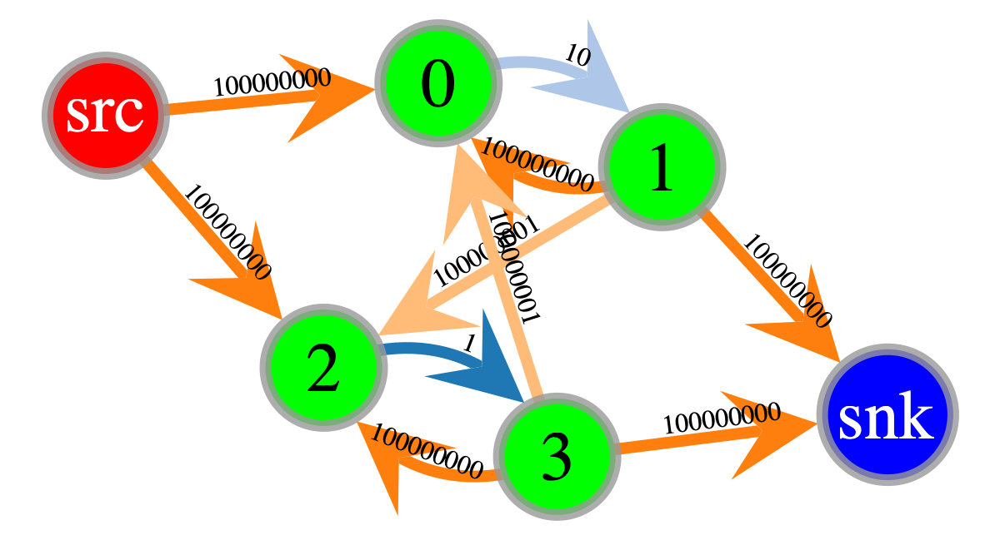

Testing with 3x3x3 array:


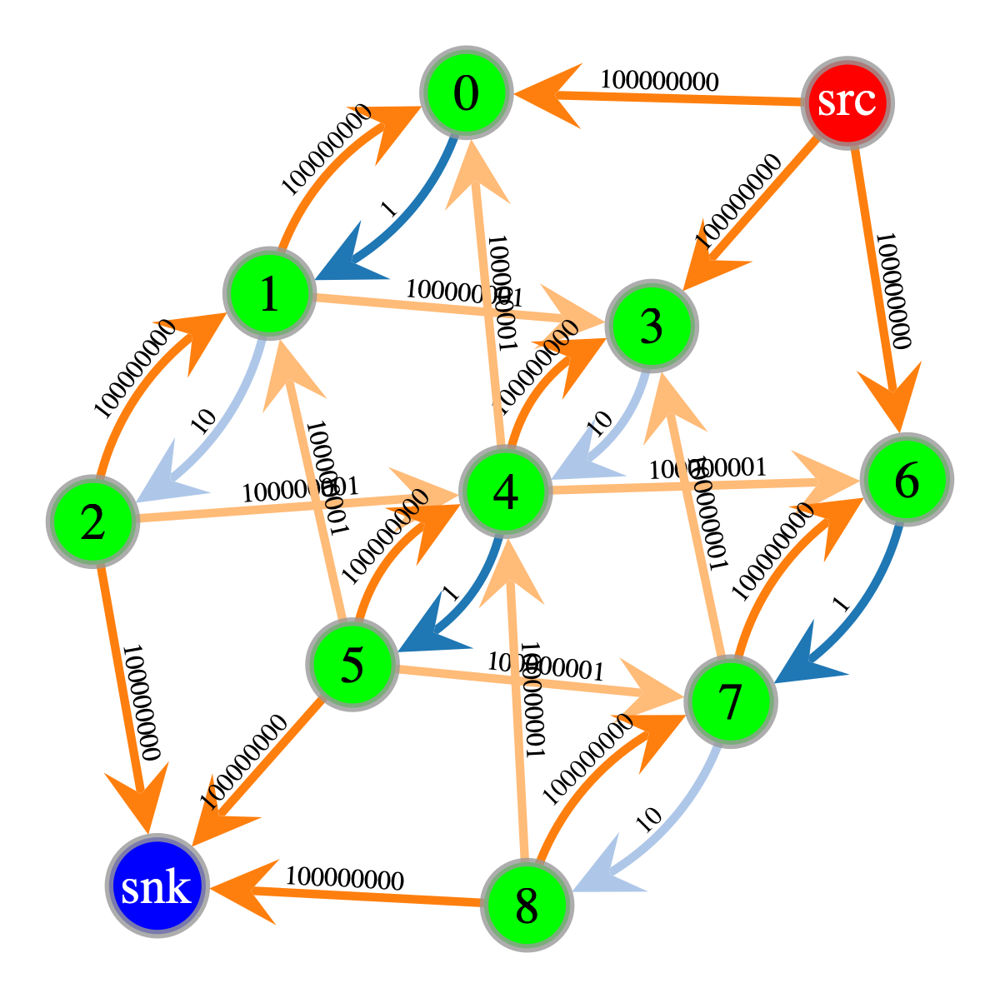

In [12]:
import numpy as np
import graph_tool.all as gt

# Example mask arrays
mask_data_2x2x2 = np.array([[[ 1,  1],
                             [ 0, 0]],
                            [[ -1, -1],
                             [ -1,  -1]]])

mask_data_3x3x3 = np.array([[[ 0,  0,  1],
                             [ -1, -1,  -1],
                             [ -1,  -1,  -1]],
                            [[ 1, 0,  0],
                             [ -1,  -1,  -1],
                             [-1,  -1,  -1]],
                            [[ 0,  0,  1],
                             [ -1, -1,  -1],
                             [ -1,  -1,  -1]]])

# Test function
def test_and_visualize(mask_data):
    g, source, sink, weight_prop, _,_,_ = create_masked_directed_energy_graph_from_mask(mask_data, direction='left', large_weight=1e8)
    
    pos = gt.sfdp_layout(g)
    color_prop = g.new_vertex_property("vector<double>")
    text_prop = g.new_vertex_property("string")
    edge_text_prop = g.new_edge_property("string")

    # Set colors and labels for source and sink
    color_prop[source] = [1, 0, 0, 1]  # Red for source
    color_prop[sink] = [0, 0, 1, 1]    # Blue for sink
    text_prop[source] = "src"
    text_prop[sink] = "snk"
    
    for v in g.vertices():
        if v != source and v != sink:
            color_prop[v] = [0, 1, 0, 1]  # Green for other vertices
            text_prop[v] = str(int(v))  # Add vertex ID as label

    for e in g.edges():
        edge_text_prop[e] = str(weight_prop[e])

    gt.graph_draw(
        g, pos=pos, vertex_fill_color=color_prop, vertex_text=text_prop, edge_text=edge_text_prop, 
        edge_color=weight_prop, output_size=(600, 600), edge_font_size=16  # Reduced font size for edge text
    )
    
# Test with 2x2x2 array
print("Testing with 2x2x2 array:")
test_and_visualize(mask_data_2x2x2)

# Test with 3x3x3 array
print("Testing with 3x3x3 array:")
test_and_visualize(mask_data_3x3x3)


In [39]:
g, source, sink, weight_prop, x_pos,y_pos,z_pos = create_masked_directed_energy_graph_from_mask(mask_data_3x3x3, direction='left', large_weight=1e8)
boundary_array, weights, flow = calculate_seam_iter(g, source, sink, weight_prop, 3, x_pos, y_pos, z_pos, update_weights=False)
print("Boundary array shape:", boundary_array.shape)

Time taken to calculate max flow boykov: 4.57763671875e-05
Time taken to calculate max flow push relabel: 3.409385681152344e-05
Time taken to calculate max flow: 0.0008051395416259766 flow: 3
Time taken to calculate max flow and min cut: 0.0002589225769042969
edges that cross the partition: 26
boundary vertices: 5
Time taken to calculate seam: 0.0002980232238769531
Time taken to convert boundary vertices to array: 4.7206878662109375e-05
Boundary array shape: (3, 3, 3)


In [40]:
if boundary_array.shape[0] <= 64:
    # Plot the 3d boundary array with plotly
    showAll = False
    # Define the grid dimensions
    x_dim, y_dim, z_dim = boundary_array.shape
    x, y, z = np.indices((x_dim, y_dim, z_dim))

    # Flatten the data
    x, y, z = x.flatten(), y.flatten(), z.flatten()
    if showAll:
        # vis_data = np.copy(test_data)
        vis_data = np.where(boundary_array != 0, 1, 0)
        vis_data[boundary_array == 1] = 2
    else:
        vis_data = boundary_array

    values = vis_data.flatten()

    # Calculate the linear index using C-style row-major order
    index = lambda i, j, k: i * y_dim * z_dim + j * z_dim + k
    indices = [index(i, j, k) for i, j, k in zip(x, y, z)]

    # Create a scatter plot
    fig = go.Figure(data=[go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(
            size=3,
            color=values,
            # colorscale='Viridis',
            colorbar=dict(title='Color Scale'),
            # opacity=0.8
            colorscale=[[0, 'green'], [0.5, 'blue'], [1.0, 'red']],  # Blue for 1, transparent for 0
            # opacity=[1 if value == 1 else 0 for value in values]  # Fully opaque for 1, fully transparent for 0
        )
    )])

    # Update layout to remove background grids and keep axes fixed
    fig.update_layout(scene=dict(
        xaxis=dict(showbackground=False, showgrid=False, showline=True, zeroline=True),
        yaxis=dict(showbackground=False, showgrid=False, showline=True, zeroline=True),
        zaxis=dict(showbackground=False, showgrid=False, showline=True, zeroline=True)
    ))

    fig.show()

In [ ]:
boundary_array, rotated_weights, flow, x_pos,y_pos,z_pos= calculate_seam_iter(rotated_directed_graph, r_src, r_tgt, rotated_weights, reduced_mask_data[res_index].shape[0], False)
b_arr_256 = upscale_and_dilate_3d(boundary_array, upscale_factor=2, dilation_amount=1)

Time taken to calculate max flow boykov: 4.3487889766693115
Time taken to calculate max flow push relabel: 1.9264400005340576
Time taken to calculate max flow: 0.04128384590148926 flow: 8848
Time taken to calculate max flow and min cut: 0.09337997436523438
edges that cross the partition: 1540352
boundary vertices: 6523
Time taken to calculate seam: 0.03543210029602051
Time taken to convert boundary vertices to array: 0.20441293716430664


Time taken to calculate max flow boykov: 4.445872783660889


KeyboardInterrupt: 

In [99]:
# copying and masking the high res data for masked graph creation
res_index = 1
masked_array = reduced_mask_data[res_index].copy()
print(masked_array.shape, b_arr_256.shape)
masked_array[b_arr_256 == 0] = -1

masked_graph, masked_src, masked_sink, masked_weights = create_masked_directed_energy_graph_from_mask(masked_array)

(128, 128, 128) (128, 128, 128)


In [105]:
print(masked_graph.num_vertices(), masked_graph.num_edges(), masked_src, masked_sink)

85804 407356 85802 85803


In [100]:
boundary_array, masked_weights, flow = calculate_seam_iter(masked_graph, masked_src, masked_sink, masked_weights, masked_array.shape[0], False)

Time taken to calculate max flow boykov: 0.05299520492553711
Time taken to calculate max flow push relabel: 0.03473615646362305
Time taken to calculate max flow: 0.003354787826538086 flow: 0
Time taken to calculate max flow and min cut: 0.006433963775634766
edges that cross the partition: 407356
boundary vertices: 0
Time taken to calculate seam: 0.00651097297668457
Time taken to convert boundary vertices to array: 1.5609378814697266


In [103]:
print("Boundary array shape:", boundary_array.shape, np.sum(boundary_array))

Boundary array shape: (128, 128, 128) 0


In [101]:
b_arr_256 = upscale_and_dilate_3d(boundary_array, upscale_factor=2, dilation_amount=1)

In [102]:
#plot label ontop of raw data
res_i = 0
def plot_slice(slice_index, axis=0):
    plt.figure(figsize=(8, 6))
    if axis == 1:
        plt.imshow(mark_boundaries_color(b_arr_256[:,slice_index,:], reduced_mask_data[res_i][:,slice_index,:]))
    elif axis == 2:
        plt.imshow(mark_boundaries_color(b_arr_256[:,:,slice_index], reduced_mask_data[res_i][:,:,slice_index]))
    else:
        plt.imshow(mark_boundaries_color(b_arr_256[slice_index,:,:], reduced_mask_data[res_i][slice_index,:,:]))
    plt.colorbar()
    plt.title(f'Slice {slice_index}')
    plt.show()

# Create a slider to browse through slices
interact(plot_slice, slice_index=IntSlider(min=0, max=b_arr_256.shape[0]-1, step=1, value=0), axis=IntSlider(min=0, max=2, step=1, value=0))

interactive(children=(IntSlider(value=0, description='slice_index', max=255), IntSlider(value=0, description='…

<function __main__.plot_slice(slice_index, axis=0)>

In [37]:
iters = 6
for i in range(0,iters):
    # bau, original_weights = calculate_seam_iter(original_directed_graph, o_src, o_tgt, original_weights, reduced_mask_data.shape[0])
    rbau, rotated_weights, flow = calculate_seam_iter(rotated_directed_graph, r_src, r_tgt, rotated_weights, reduced_mask_data_t.shape[0])

    # original_boundary_array += bau

    overlap = np.sum(np.logical_and(rotated_boundary_array, rbau))
    print("Sum of overlap:", overlap)
    rotated_boundary_array += rbau

    print("Iteration:", i)

Time taken to calculate max flow push relabel: 2.157573699951172
Time taken to calculate max flow: 0.04216480255126953 flow: 8848
Time taken to calculate max flow and min cut: 0.09460592269897461
edges that cross the partition: 1540352
boundary vertices: 6523
Time taken to calculate seam: 0.023988008499145508
Time taken to convert boundary vertices to array: 0.2067859172821045
Time taken to convert seam voxels to graph indices: 0.003503084182739258
Time taken to update weights:  4.134232997894287
Time taken to update weights outside fxn: 4.135416030883789
Sum of overlap: 0
Iteration: 0
Time taken to calculate max flow push relabel: 1.3176209926605225
Time taken to calculate max flow: 0.04140639305114746 flow: 8893
Time taken to calculate max flow and min cut: 0.0738821029663086
edges that cross the partition: 1540352
boundary vertices: 6945
Time taken to calculate seam: 0.023860931396484375
Time taken to convert boundary vertices to array: 0.19855594635009766
Time taken to convert seam

In [38]:
# Create the new boundary array initialized to zeros
boundary_array = np.zeros_like(original_boundary_array)
boundary_array[original_boundary_array > 0] = 1
boundary_array[rotated_boundary_array > 0] = 2
if reduced_mask_data_t.shape[0] <= 64:

    # Plot the 3d boundary array with plotly
    showAll = False
    # Define the grid dimensions
    x_dim, y_dim, z_dim = boundary_array.shape
    x, y, z = np.indices((x_dim, y_dim, z_dim))

    # Flatten the data
    x, y, z = x.flatten(), y.flatten(), z.flatten()
    if showAll:
        # vis_data = np.copy(test_data)
        vis_data = np.where(reduced_mask_data_t != 0, 1, 0)
        vis_data[boundary_array == 1] = 2
    else:
        vis_data = boundary_array

    values = vis_data.flatten()

    # Calculate the linear index using C-style row-major order
    index = lambda i, j, k: i * y_dim * z_dim + j * z_dim + k
    indices = [index(i, j, k) for i, j, k in zip(x, y, z)]

    # Create a scatter plot
    fig = go.Figure(data=[go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(
            size=1,
            color=values,
            # colorscale='Viridis',
            colorbar=dict(title='Color Scale'),
            # opacity=0.8
            colorscale=[[0, 'rgba(0, 0, 0, 0)'], [0.5, 'blue'], [1.0, 'red']],  # Blue for 1, transparent for 0
            # opacity=[1 if value == 1 else 0 for value in values]  # Fully opaque for 1, fully transparent for 0
        )
    )])

    # Update layout to remove background grids and keep axes fixed
    fig.update_layout(scene=dict(
        xaxis=dict(showbackground=False, showgrid=False, showline=True, zeroline=True),
        yaxis=dict(showbackground=False, showgrid=False, showline=True, zeroline=True),
        zaxis=dict(showbackground=False, showgrid=False, showline=True, zeroline=True)
    ))

    fig.show()


In [39]:
# boundary_array = np.where(boundary_array != 0, 1, 0)
boundary_array = rotated_boundary_array
boundary_array = np.where(boundary_array != 0, 1, 0)
def plot_slice(slice_index, axis=0):
    plt.figure(figsize=(8, 6))
    if axis == 1:
        plt.imshow(mark_boundaries_color(reduced_raw_data_t[:,slice_index,:], boundary_array[:,slice_index,:]))
    elif axis == 2:
        plt.imshow(mark_boundaries_color(reduced_raw_data_t[:,:,slice_index], boundary_array[:,:,slice_index]))
    else:
        plt.imshow(mark_boundaries_color(reduced_raw_data_t[slice_index,:,:], boundary_array[slice_index,:,:]))
    plt.colorbar()
    plt.title(f'Slice {slice_index}')
    plt.show()
 
print(reduced_raw_data_t.max(), reduced_raw_data_t.min())
# Create a slider to browse through slices
interact(plot_slice, slice_index=IntSlider(min=0, max=reduced_raw_data[res_index].shape[0]-1, step=1, value=0), axis=IntSlider(min=0, max=2, step=1, value=0))

65535 9235


interactive(children=(IntSlider(value=0, description='slice_index', max=63), IntSlider(value=0, description='a…

<function __main__.plot_slice(slice_index, axis=0)>

In [40]:
def remove_voxels(data_array, boundary_array, num_voxels_to_remove, direction='x'):
    """
    Removes a specified number of voxels from each row in the given direction
    based on a boundary mask array.
    
    Parameters:
    data_array (np.ndarray): The original 3D array from which voxels are to be removed.
    boundary_array (np.ndarray): The boundary mask 3D array specifying the voxels to be removed.
    num_voxels_to_remove (int): Number of voxels to be removed from each row.
    direction (str): The direction in which voxels are to be removed ('x', 'y', 'z').
    
    Returns:
    np.ndarray: The resulting 3D array with the specified voxels removed.
    """
    assert data_array.shape == boundary_array.shape, "Data array and boundary array must have the same shape."
    assert direction in ['x', 'y', 'z'], "Direction must be 'x', 'y', or 'z'."
    
    if direction == 'x':
        new_shape = (data_array.shape[0], data_array.shape[1], data_array.shape[2] - num_voxels_to_remove)
        result_array = np.zeros(new_shape, dtype=data_array.dtype)
        for i in range(data_array.shape[0]):
            for j in range(data_array.shape[1]):
                data_row = data_array[i, j, :]
                boundary_row = boundary_array[i, j, :]
                keep_indices = np.where(boundary_row == 0)[0]
                keep_indices = keep_indices[:new_shape[2]]  # Only keep up to the new size
                result_array[i, j, :] = data_row[keep_indices][:new_shape[2]]
    
    elif direction == 'y':
        new_shape = (data_array.shape[0], data_array.shape[1] - num_voxels_to_remove, data_array.shape[2])
        result_array = np.zeros(new_shape, dtype=data_array.dtype)
        for i in range(data_array.shape[0]):
            for k in range(data_array.shape[2]):
                data_row = data_array[i, :, k]
                boundary_row = boundary_array[i, :, k]
                keep_indices = np.where(boundary_row == 0)[0]
                keep_indices = keep_indices[:new_shape[1]]  # Only keep up to the new size
                result_array[i, :, k] = data_row[keep_indices][:new_shape[1]]
    
    elif direction == 'z':
        new_shape = (data_array.shape[0] - num_voxels_to_remove, data_array.shape[1], data_array.shape[2])
        result_array = np.zeros(new_shape, dtype=data_array.dtype)
        for j in range(data_array.shape[1]):
            for k in range(data_array.shape[2]):
                data_row = data_array[:, j, k]
                boundary_row = boundary_array[:, j, k]
                keep_indices = np.where(boundary_row == 0)[0]
                keep_indices = keep_indices[:new_shape[0]]  # Only keep up to the new size
                result_array[:, j, k] = data_row[keep_indices][:new_shape[0]]
    
    return result_array

In [41]:
print(iters)
densified_data = remove_voxels(reduced_raw_data_t, boundary_array, iters, direction='x')
densified_label = remove_voxels(reduced_mask_data_t, boundary_array, iters, direction='x')
print(densified_data.shape, densified_label.shape)

6
(64, 64, 58) (64, 64, 58)


In [42]:
#save teh boundary array, densified data and densified label as nrrd files in /output
nrrd.write(f"{current_directory}/output/boundary_array.nrrd", boundary_array)
nrrd.write(f"{current_directory}/output/densified_data.nrrd", densified_data)
nrrd.write(f"{current_directory}/output/densified_label.nrrd", densified_label)

In [43]:
def plot_slice(slice_index, axis=0):
    plt.figure(figsize=(8, 6))
    if axis == 1:
        plt.imshow(densified_data[:,slice_index,:],cmap='gray')
    elif axis == 2:
        plt.imshow(densified_data[:,:,slice_index],cmap='gray')
    else:
        plt.imshow(densified_data[slice_index,:,:],cmap='gray')
    plt.colorbar()
    plt.title(f'Slice {slice_index}')
    plt.show()
 
print(reduced_raw_data_t.max(), reduced_raw_data_t.min())
# Create a slider to browse through slices
interact(plot_slice, slice_index=IntSlider(min=0, max=densified_data.shape[0]-1, step=1, value=0), axis=IntSlider(min=0, max=2, step=1, value=0))

65535 9235


interactive(children=(IntSlider(value=0, description='slice_index', max=63), IntSlider(value=0, description='a…

<function __main__.plot_slice(slice_index, axis=0)>

In [44]:
def plot_slice(slice_index, axis=0):
    plt.figure(figsize=(8, 6))
    if axis == 1:
        plt.imshow(densified_label[:,slice_index,:])
    elif axis == 2:
        plt.imshow(densified_label[:,:,slice_index])
    else:
        plt.imshow(densified_label[slice_index,:,:])
    plt.colorbar()
    plt.title(f'Slice {slice_index}')
    plt.show()
 
print(reduced_raw_data_t.max(), reduced_raw_data_t.min())
# Create a slider to browse through slices
interact(plot_slice, slice_index=IntSlider(min=0, max=densified_data.shape[0]-1, step=1, value=0), axis=IntSlider(min=0, max=2, step=1, value=0))

65535 9235


interactive(children=(IntSlider(value=0, description='slice_index', max=63), IntSlider(value=0, description='a…

<function __main__.plot_slice(slice_index, axis=0)>